References

In [ ]:
RESEARCH PAPER:https://ieeexplore.ieee.org/document/9166317
CLAHE: https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html


Installing library

In [ ]:
pip install mtcnn

     |████████████████████████████████| 2.3 MB 5.0 MB/s 


Setting up environment

In [ ]:
import os
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from os import listdir
from PIL import Image as Img
from numpy import asarray
from numpy import expand_dims
from keras.models import load_model
import numpy as np
import tensorflow as tf
from mtcnn.mtcnn import MTCNN
import pickle
import cv2

Base Functions 

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.preprocessing import Normalizer


# get encode
def get_encode(face_encoder, face, size):
    face = normalize(face)
    face = cv2.resize(face, size)
    encode = face_encoder.predict(np.expand_dims(face, axis=0))[0]
    return encode


def get_face(img, box):
    x1, y1, width, height = box
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    face = img[y1:y2, x1:x2]
    return face, (x1, y1), (x2, y2)


l2_normalizer = Normalizer('l2')


def normalize(img):
    mean, std = img.mean(), img.std()
    return (img - mean) / std


def plt_show(cv_img):
    img_rgb = cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.show()


def load_pickle(path):
    with open(path, 'rb') as f:
        encoding_dict = pickle.load(f)
    return encoding_dict


def save_pickle(path, obj):
    with open(path, 'wb') as file:
        pickle.dump(obj, file)


def read_vc(vc, func_to_call, break_print=':(', show=False, win_name='', break_key='q', **kwargs):
    while vc.isOpened():
        ret, frame = vc.read()
        if not ret:
            print(break_print)
            break
        res = func_to_call(frame, **kwargs)
        if res is not None:
            frame = res

        if show:
            cv2.imshow(win_name, frame)
        if cv2.waitKey(1) & 0xff == ord(break_key):
            break

Connecting Google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Getting the pre-trained model

In [ ]:
encoder_model = '/content/drive/MyDrive/FYP/FYP/Weights/facenet_keras.h5'
people_dir = '/content/drive/MyDrive/FYP/FYP/Dataset/Batch1/Individual'
encodings_path = '/content/encodings.pkl'

recognition_t = 0.3
required_size = (160, 160)
encoding_dict = dict()



loading model

In [ ]:
face_detector = MTCNN()
face_encoder = load_model(encoder_model)

Creating face encodings for all the indiviuals

In [ ]:
for person_name in os.listdir(people_dir):
  if person_name != 'representations_facenet.pkl':
    person_dir = os.path.join(people_dir, person_name)
    encodes = []
    for img_name in os.listdir(person_dir):
          img_path = os.path.join(person_dir, img_name)
          img = cv2.imread(img_path)
          img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
          results = face_detector.detect_faces(img_rgb)
          if results:
              res = max(results, key=lambda b: b['box'][2] * b['box'][3])
              face, _, _ = get_face(img_rgb, res['box'])
              
              face = normalize(face)
              face = cv2.resize(face, required_size)
              encode = face_encoder.predict(np.expand_dims(face, axis=0))[0]
              encodes.append(encode)
    if encodes:
        encode = np.sum(encodes, axis=0)
        encode = l2_normalizer.transform(np.expand_dims(encode, axis=0))[0]
        encoding_dict[person_name] = encode  

In [ ]:
for key, val in encoding_dict.items():
    print(key, val.shape)

In [ ]:
save_pickle(encodings_path, encoding_dict)
#encoding_dict = cv2.imwrite('/content/drive/MyDrive/FYP/Dataset/Batch1')

Reading the image

In [ ]:
test_img_path = '/content/lowlight3.jpg'
test_res_path = '/content/result.jpg'
img = cv2.imread(test_img_path)

Applying CLAHE technique

In [ ]:
lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

lab_planes = cv2.split(lab)

clahe = cv2.createCLAHE(clipLimit=1.5)

lab_planes[0] = clahe.apply(lab_planes[0])

lab = cv2.merge(lab_planes)

bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
cv2_imshow(bgr)
img= bgr


Face recognition using FaceNet

In [ ]:
from scipy.spatial.distance import cosine
from PIL import Image, ImageDraw

pil_image = Image.fromarray(img)
# Create a Pillow ImageDraw Draw instance to draw with
draw = ImageDraw.Draw(pil_image)

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
results = face_detector.detect_faces(img_rgb)
for res in results:
    face, pt_1, pt_2 = get_face(img_rgb, res['box'])
    encode = get_encode(face_encoder, face, required_size)
    encode = l2_normalizer.transform(np.expand_dims(encode, axis=0))[0]
    
    name = 'unknown'
    distance = float("inf")
    
    for db_name, db_encode in encoding_dict.items():
        dist = cosine(db_encode, encode)
        if dist < recognition_t and dist < distance:
            name = db_name
            distance = dist
    if name == 'unknown':
        cv2.rectangle(img, pt_1, pt_2, (0,0, 255),2)
        cv2.putText(img,name, pt_1,cv2.FONT_HERSHEY_PLAIN, 1, (0,0,255), 2)
    else:
      cv2.rectangle(img, pt_1, pt_2, (0, 255, 0),2)
      cv2.putText(img,name, pt_1 ,cv2.FONT_HERSHEY_PLAIN, 1, (0,255,0), 2) 
      

Result

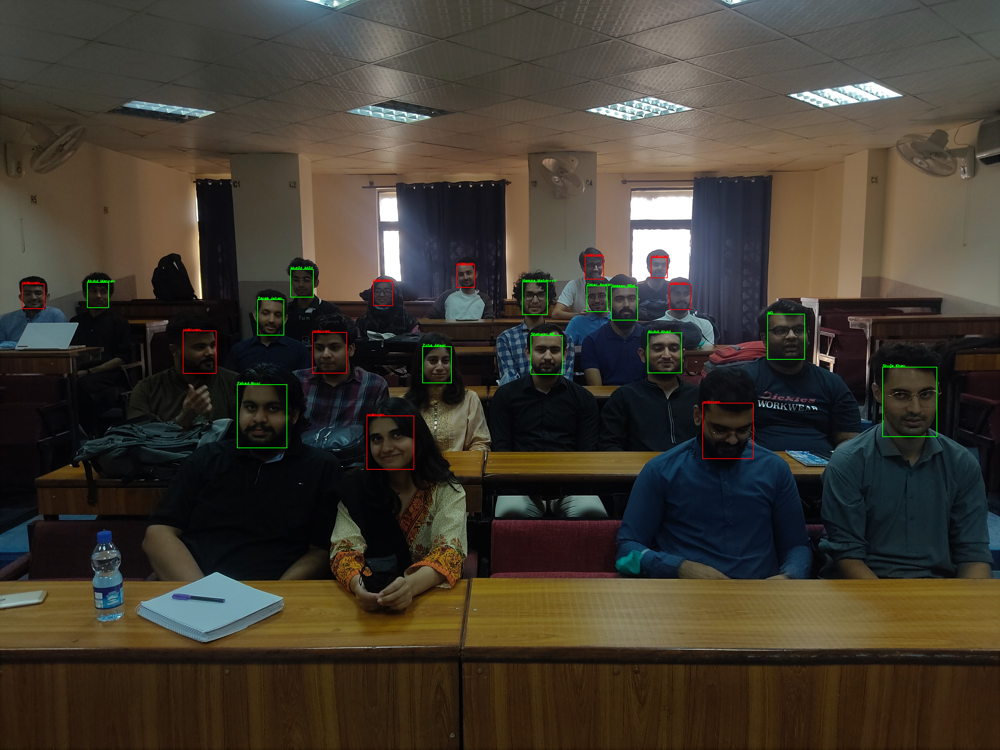

True

In [ ]:
cv2_imshow(img)
cv2.imwrite(test_res_path,img)